# Predicting Stock Prices with LSTM: A Deep Learning Approach


**Summary of the Notebook**

This notebook demonstrates how to use deep learning, specifically Long Short-Term Memory (LSTM) networks, for stock price prediction. The workflow covers data import, preprocessing, feature engineering, model building, training, evaluation, and prediction for multiple major stocks such as Apple (AAPL), Amazon (AMZN), and Tesla (TSLA)

**IMPORT DATASETS AND LIBRARIES**

In [1]:
import pandas as pd
import plotly.express as px
from copy import copy
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import plotly.figure_factory as ff
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from tensorflow import keras


In [2]:
# Read stock prices data

stock_df = pd.read_csv('stock_ML in finance.csv')

stock_df.head(10)

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.13,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.35,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.25,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.73,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.80,194.449997,180.520004,26.760000,318.590851,1314.500000
5,2012-01-20,60.042858,75.519997,30.510000,12.64,190.929993,188.520004,26.600000,291.900879,1315.380005
6,2012-01-23,61.058571,75.510002,30.400000,13.14,186.089996,189.979996,26.770000,291.666748,1316.000000
7,2012-01-24,60.058571,75.360001,30.090000,13.16,187.000000,191.929993,27.420000,289.380341,1314.650024
8,2012-01-25,63.808571,75.820000,30.209999,13.11,187.800003,191.729996,27.969999,283.681702,1326.060059
9,2012-01-26,63.518570,75.309998,29.450001,13.05,193.320007,190.979996,28.940001,282.989288,1318.430054


In [3]:
stock_df.tail(10)

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
2149,2020-07-29,380.160004,166.009995,29.559999,16.250000,3033.530029,125.320000,1499.109985,1522.020020,3258.439941
2150,2020-07-30,384.760010,161.949997,29.570000,16.639999,3051.879883,122.900002,1487.489990,1531.449951,3246.219971
2151,2020-07-31,425.040009,158.000000,29.580000,16.090000,3164.679932,122.940002,1430.760010,1482.959961,3271.120117
2152,2020-08-03,435.750000,162.270004,29.620001,16.320000,3111.889893,124.309998,1485.000000,1474.449951,3294.610107
2153,2020-08-04,438.660004,165.070007,30.010000,16.719999,3138.830078,125.839996,1487.000000,1464.969971,3306.510010
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971
2158,2020-08-11,437.500000,180.130005,30.200001,21.500000,3080.669922,126.750000,1374.390015,1480.319946,3333.689941


**The data is collected from 2012 to 2020**

In [4]:
# Read the stocks volume data

stock_volume_df = pd.read_csv('stock_volume.csv')

stock_volume_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,53146800,3934500,26511100,17891100,5385800,6881000,729300,3764400,4019890000
1,2012-01-13,56505400,4641100,22096800,16621800,4753500,5279200,5500400,4631800,3692370000
2,2012-01-17,60724300,3700100,23500200,15480800,5644500,6003400,4651600,3832800,4010490000
3,2012-01-18,69197800,4189500,22015000,18387600,7473500,4600600,1260200,5544000,4096160000
4,2012-01-19,65434600,5397300,25524000,14022900,7096000,8567200,1246300,12657800,4465890000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,30498000,46551000,22991700,18914200,3930000,3675400,4978000,1979500,4732220000
2155,2020-08-06,50607200,32921600,21908700,35867700,3940600,3417100,5992300,1995400,4267490000
2156,2020-08-07,49453300,19301600,30398500,34530300,3929600,3651000,8883500,1576600,4104860000
2157,2020-08-10,53100900,35857700,35514400,71219700,3167300,3968300,7522300,1289300,4318570000


In [5]:
# Sort the data based on Date

stock_df = stock_df.sort_values(by = 'Date')

stock_df.head()

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.13,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.35,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.25,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.73,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.80,194.449997,180.520004,26.760000,318.590851,1314.500000


In [6]:
# Sort the volume data based on Date
stock_volume_df = stock_volume_df.sort_values(by = 'Date')

stock_volume_df.head()

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,53146800,3934500,26511100,17891100,5385800,6881000,729300,3764400,4019890000
1,2012-01-13,56505400,4641100,22096800,16621800,4753500,5279200,5500400,4631800,3692370000
2,2012-01-17,60724300,3700100,23500200,15480800,5644500,6003400,4651600,3832800,4010490000
3,2012-01-18,69197800,4189500,22015000,18387600,7473500,4600600,1260200,5544000,4096160000
4,2012-01-19,65434600,5397300,25524000,14022900,7096000,8567200,1246300,12657800,4465890000


**Preliminary EDA**

In [7]:
# Check if Null values exist in stock prices data

stock_df.isnull().sum()

Date     0
AAPL     0
BA       0
T        0
MGM      0
AMZN     0
IBM      0
TSLA     0
GOOG     0
sp500    0
dtype: int64

In [8]:
# Check if Null values exist in stocks volume data

stock_volume_df.isnull().sum()

Date     0
AAPL     0
BA       0
T        0
MGM      0
AMZN     0
IBM      0
TSLA     0
GOOG     0
sp500    0
dtype: int64

In [9]:
# Get stock prices dataframe info

stock_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2159 entries, 0 to 2158
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2159 non-null   object 
 1   AAPL    2159 non-null   float64
 2   BA      2159 non-null   float64
 3   T       2159 non-null   float64
 4   MGM     2159 non-null   float64
 5   AMZN    2159 non-null   float64
 6   IBM     2159 non-null   float64
 7   TSLA    2159 non-null   float64
 8   GOOG    2159 non-null   float64
 9   sp500   2159 non-null   float64
dtypes: float64(9), object(1)
memory usage: 168.8+ KB


In [10]:
# Get stock volume dataframe info

stock_volume_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2159 entries, 0 to 2158
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Date    2159 non-null   object
 1   AAPL    2159 non-null   int64 
 2   BA      2159 non-null   int64 
 3   T       2159 non-null   int64 
 4   MGM     2159 non-null   int64 
 5   AMZN    2159 non-null   int64 
 6   IBM     2159 non-null   int64 
 7   TSLA    2159 non-null   int64 
 8   GOOG    2159 non-null   int64 
 9   sp500   2159 non-null   int64 
dtypes: int64(9), object(1)
memory usage: 168.8+ KB


In [11]:
stock_volume_df.describe()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
count,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03
mean,5.820332e+07,6.419916e+06,2.832131e+07,9.845582e+06,4.102673e+06,4.453090e+06,7.001302e+06,2.498238e+06,3.680732e+09
std,4.568141e+07,9.711873e+06,1.428911e+07,7.295753e+06,2.290722e+06,2.462811e+06,5.781208e+06,1.928407e+06,8.622717e+08
min,1.136200e+07,7.889000e+05,6.862400e+06,9.507000e+05,8.813000e+05,1.193000e+06,3.649000e+05,7.900000e+03,1.248960e+09
25%,2.769930e+07,3.031850e+06,2.002150e+07,5.796450e+06,2.675700e+06,3.111250e+06,3.433450e+06,1.325400e+06,3.211890e+09
50%,4.209420e+07,3.991000e+06,2.485930e+07,7.899800e+06,3.494800e+06,3.825000e+06,5.581100e+06,1.813900e+06,3.526890e+09
75%,7.182480e+07,5.325900e+06,3.210565e+07,1.104055e+07,4.768150e+06,4.937300e+06,8.619550e+06,3.245350e+06,3.933290e+09
max,3.765300e+08,1.032128e+08,1.950827e+08,9.009820e+07,2.385610e+07,3.049020e+07,6.093880e+07,2.497790e+07,9.044690e+09


In [12]:
stock_df.describe()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
count,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000
mean,140.819823,189.942700,35.162899,23.105743,915.665665,161.853001,259.600815,783.712512,2218.749554
std,70.827601,103.678586,3.207490,6.963847,697.838905,25.561938,210.988003,334.448057,537.321727
min,55.790001,67.239998,26.770000,7.140000,175.929993,94.769997,22.790001,278.481171,1278.040039
25%,89.165714,124.015000,33.040001,18.545000,316.490005,142.769997,184.595001,527.214416,1847.984985
50%,116.599998,142.419998,34.930000,23.780001,676.010010,156.949997,231.960007,737.599976,2106.629883
75%,175.019997,297.044998,37.419998,28.430000,1593.645019,185.974998,307.350006,1079.744995,2705.810059
max,455.609985,440.619995,43.470001,38.029999,3225.000000,215.800003,1643.000000,1568.489990,3386.149902


In [13]:
#What is the average trading volume for Apple stock?

stock_volume_df['AAPL'].mean()

58203317.41547012

In [14]:
#What is the maximum trading volume for sp500?

stock_volume_df['sp500'].max()

9044690000

In [15]:
#Which security is traded the most?

average_value = stock_volume_df.drop(columns = ['Date']).mean()

average_value

AAPL     5.820332e+07
BA       6.419916e+06
T        2.832131e+07
MGM      9.845582e+06
AMZN     4.102673e+06
IBM      4.453090e+06
TSLA     7.001302e+06
GOOG     2.498238e+06
sp500    3.680732e+09
dtype: float64

In [16]:
max_traded_security = average_value.max()

max_traded_security

3680732468.7355256

This is value is of S&P 500. Thus, it is the maximum traded security. However, S&P 500 is not a stock but is a benchmark index. 

In [17]:
#What is the average stock price of the S&P500 over the specified time period?

stock_df['sp500'].mean()

2218.7495540592868

In [18]:
#What is the maximum price of Tesla Stock?

stock_df['TSLA'].max()

1643.0

In [19]:
# Function to normalize stock prices based on their initial price

def normalize(df):
    x = df.copy()
    for i in x.columns[1:]:
        x[i] = x[i] / x[i][0]
    return x
        

In [20]:
normalize(stock_df)

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2012-01-13,0.996251,0.987949,0.998340,1.018137,1.014153,0.992301,0.806726,0.992615,0.995052
2,2012-01-17,1.007855,0.996424,1.004316,1.009893,1.032570,0.996954,0.941593,0.998317,0.998587
3,2012-01-18,1.018320,0.994040,1.006972,1.049464,1.076792,1.002880,0.949027,1.005193,1.009680
4,2012-01-19,1.015093,1.000662,1.009960,1.055235,1.105269,0.999834,0.947257,1.015771,1.014666
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,7.313297,2.308039,0.991036,1.378401,18.217644,0.694821,52.567080,4.698347,2.568715
2155,2020-08-06,7.568452,2.280493,0.990704,1.521847,18.331155,0.698532,52.728494,4.782805,2.585226
2156,2020-08-07,7.383066,2.251622,0.996680,1.568838,18.004093,0.692107,51.423361,4.764919,2.586862
2157,2020-08-10,7.490377,2.375977,1.002656,1.784831,17.894390,0.704016,50.214865,4.770052,2.593956


In [21]:
# Function to plot interactive plots using Plotly Express

def interactive_plot(df, title):
    fig = px.line(title = title)
    for i in df.columns[1:]:
        fig.add_scatter(x = df['Date'], y = df[i] , name = i)
    fig.show()


In [22]:
# plot interactive chart for stocks data
interactive_plot(stock_df, "Plot of Raw Data")

In [23]:
interactive_plot(normalize(stock_df), "Plot of Normalized Stock Prices")

In [24]:
#Plot the volume dataset for all stocks, list any observations you might see.

interactive_plot(stock_volume_df, "Plot of Stocks Volume")

In [25]:
interactive_plot(normalize(stock_volume_df), "Plot of normalized stock volume" )

**Prepare The Data Before Training The AI/ML Model**

In [26]:
# Function to concatenate the date, stock price, and volume in one dataframe

def individual_stocks(price_df, volume_df, name):
    return pd.DataFrame({'Date': price_df['Date'], 'Close':price_df[name], 'Volume':volume_df[name]})

In [27]:
# Function to return the input/output (target) data for AI/ML Model
# Note that our goal is to predict the future stock price
# Target stock price today will be tomorrow's price

def trading_window(data):

    n = 1 #Day-1 window

    data['Target'] = data[['Close']].shift(-n) #Create a new column containing prices of next days

    return data 



In [28]:
# Let's test the functions and get individual stock prices and volumes for AAPL

price_volume_df = individual_stocks(stock_df, stock_volume_df, 'AAPL')
price_volume_df 

,Date,Close,Volume
0,2012-01-12,60.198570,53146800
1,2012-01-13,59.972858,56505400
2,2012-01-17,60.671429,60724300
3,2012-01-18,61.301430,69197800
4,2012-01-19,61.107143,65434600
...,...,...,...
2154,2020-08-05,440.250000,30498000
2155,2020-08-06,455.609985,50607200
2156,2020-08-07,444.450012,49453300
2157,2020-08-10,450.910004,53100900


In [29]:
price_volume_target_df = trading_window(price_volume_df)
price_volume_target_df

,Date,Close,Volume,Target
0,2012-01-12,60.198570,53146800,59.972858
1,2012-01-13,59.972858,56505400,60.671429
2,2012-01-17,60.671429,60724300,61.301430
3,2012-01-18,61.301430,69197800,61.107143
4,2012-01-19,61.107143,65434600,60.042858
...,...,...,...,...
2154,2020-08-05,440.250000,30498000,455.609985
2155,2020-08-06,455.609985,50607200,444.450012
2156,2020-08-07,444.450012,49453300,450.910004
2157,2020-08-10,450.910004,53100900,437.500000


In [30]:
# Remove the last row as it will be a null value
price_volume_target_df = price_volume_target_df[:-1]
price_volume_target_df

,Date,Close,Volume,Target
0,2012-01-12,60.198570,53146800,59.972858
1,2012-01-13,59.972858,56505400,60.671429
2,2012-01-17,60.671429,60724300,61.301430
3,2012-01-18,61.301430,69197800,61.107143
4,2012-01-19,61.107143,65434600,60.042858
...,...,...,...,...
2153,2020-08-04,438.660004,43267900,440.250000
2154,2020-08-05,440.250000,30498000,455.609985
2155,2020-08-06,455.609985,50607200,444.450012
2156,2020-08-07,444.450012,49453300,450.910004


In [31]:
# Scale the data
from sklearn.preprocessing import MinMaxScaler

sc = MinMaxScaler(feature_range = (0,1))

price_volume_target_scaled_df = sc.fit_transform(price_volume_target_df.drop(columns = ['Date']))

In [32]:
price_volume_target_scaled_df

array([[0.01102638, 0.11442624, 0.01046185],
       [0.01046185, 0.12362365, 0.01220906],
       [0.01220906, 0.13517696, 0.01378478],
       ...,
       [1.        , 0.10747163, 0.97208751],
       [0.97208751, 0.10431171, 0.98824476],
       [0.98824476, 0.11430054, 0.95470465]])

In [33]:
price_volume_target_scaled_df.shape

(2158, 3)

In [34]:
# Create Feature and Target- to separate input and output

X = price_volume_target_scaled_df[:, :2]

y = price_volume_target_scaled_df[:, 2:]


In [35]:
X

array([[0.01102638, 0.11442624],
       [0.01046185, 0.12362365],
       [0.01220906, 0.13517696],
       ...,
       [1.        , 0.10747163],
       [0.97208751, 0.10431171],
       [0.98824476, 0.11430054]])

In [36]:
y

array([[0.01046185],
       [0.01220906],
       [0.01378478],
       ...,
       [0.97208751],
       [0.98824476],
       [0.95470465]])

In [37]:
# Spliting the data this way, since order is important in time-series
# Note that we did not use train test split with it's default settings since it shuffles the data


In [38]:
X.shape

(2158, 2)

In [39]:
y.shape

(2158, 1)

In [40]:
split = int(0.65*len(X))

split

1402

In [41]:
X_train = X[:split]

X_train.shape

(1402, 2)

In [42]:
y_train = y[:split]

y_train.shape

(1402, 1)

In [43]:
X_test = X[split:]

y_test = y[split:]

In [44]:
X_test.shape

(756, 2)

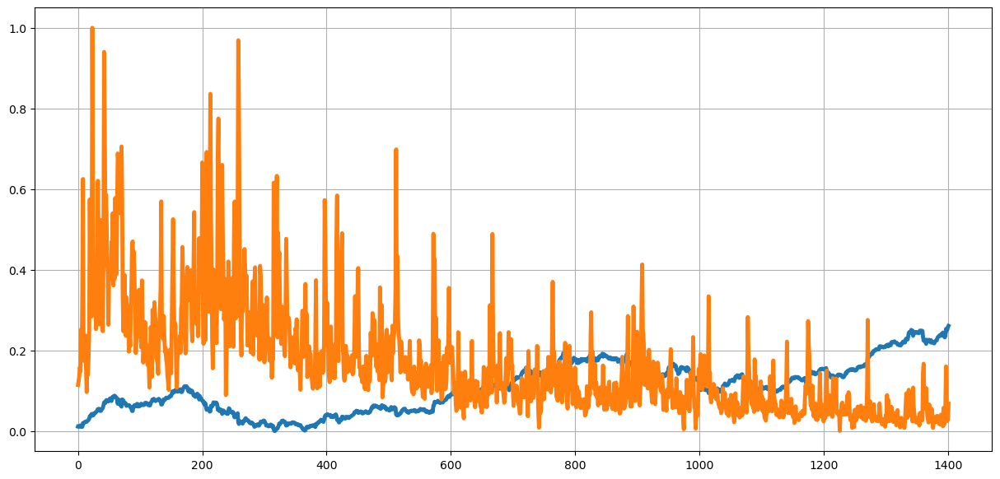

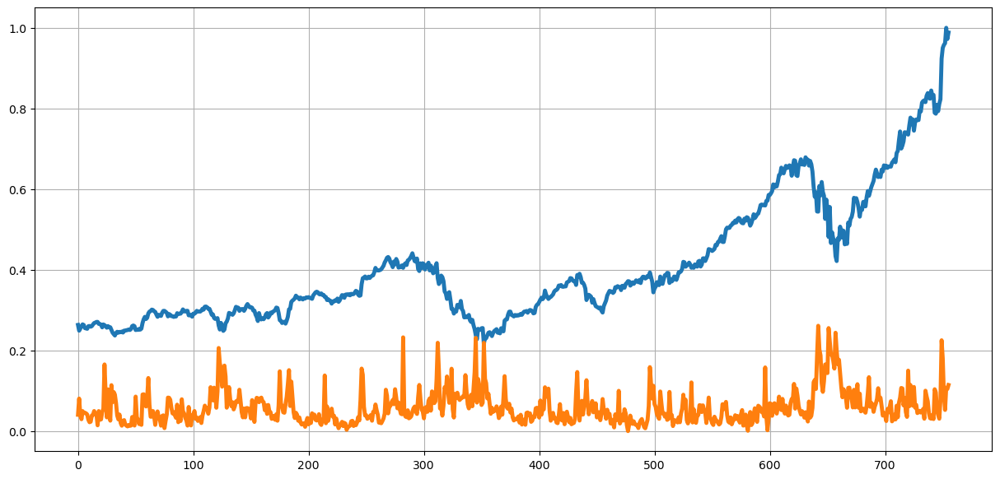

In [45]:
# Define a data plotting function

def show_plot(data, title):
    plt.figure(figsize = (15,7))
    plt.plot(data, linewidth = 3.5)
    plt.grid()

show_plot(X_train, 'Training Data')
show_plot(X_test, 'Testing Data')



**Test the created pipeline with S&P500 and Amazon datasets**

In [46]:
#Test the created pipeline with S&P500 and Amazon datasets

price_volume_AMZN = individual_stocks(stock_df, stock_volume_df, 'AMZN')
price_volume_AMZN

,Date,Close,Volume
0,2012-01-12,175.929993,5385800
1,2012-01-13,178.419998,4753500
2,2012-01-17,181.660004,5644500
3,2012-01-18,189.440002,7473500
4,2012-01-19,194.449997,7096000
...,...,...,...
2154,2020-08-05,3205.030029,3930000
2155,2020-08-06,3225.000000,3940600
2156,2020-08-07,3167.459961,3929600
2157,2020-08-10,3148.159912,3167300


In [47]:
price_volume_target_AMZN = trading_window(price_volume_AMZN)
price_volume_target_AMZN

,Date,Close,Volume,Target
0,2012-01-12,175.929993,5385800,178.419998
1,2012-01-13,178.419998,4753500,181.660004
2,2012-01-17,181.660004,5644500,189.440002
3,2012-01-18,189.440002,7473500,194.449997
4,2012-01-19,194.449997,7096000,190.929993
...,...,...,...,...
2154,2020-08-05,3205.030029,3930000,3225.000000
2155,2020-08-06,3225.000000,3940600,3167.459961
2156,2020-08-07,3167.459961,3929600,3148.159912
2157,2020-08-10,3148.159912,3167300,3080.669922


In [48]:
# Remove the last row as it will be a null value

price_volume_target_AMZN = price_volume_target_AMZN[:-1]
price_volume_target_AMZN

,Date,Close,Volume,Target
0,2012-01-12,175.929993,5385800,178.419998
1,2012-01-13,178.419998,4753500,181.660004
2,2012-01-17,181.660004,5644500,189.440002
3,2012-01-18,189.440002,7473500,194.449997
4,2012-01-19,194.449997,7096000,190.929993
...,...,...,...,...
2153,2020-08-04,3138.830078,4694300,3205.030029
2154,2020-08-05,3205.030029,3930000,3225.000000
2155,2020-08-06,3225.000000,3940600,3167.459961
2156,2020-08-07,3167.459961,3929600,3148.159912


In [49]:
#Scaling

price_volume_target_scaled_AMZN = sc.fit_transform(price_volume_target_AMZN.drop(columns = ['Date']))

In [50]:
price_volume_target_scaled_AMZN

array([[0.00000000e+00, 1.96062643e-01, 0.00000000e+00],
       [8.16644090e-04, 1.68541184e-01, 1.06348955e-03],
       [1.87926515e-03, 2.07322806e-01, 3.61717204e-03],
       ...,
       [1.00000000e+00, 1.33158939e-01, 9.81113236e-01],
       [9.81128659e-01, 1.32680154e-01, 9.74778247e-01],
       [9.74798844e-01, 9.95003221e-02, 9.52625541e-01]])

In [51]:
price_volume_target_scaled_AMZN.shape

(2158, 3)

In [52]:
# Create Feature and Target- to separate input and output

X_AMZN = price_volume_target_scaled_AMZN[:, :2]

y_AMZN = price_volume_target_scaled_AMZN[:, 2:]

In [53]:
X_AMZN.shape #This has two columns: Close and Volume

(2158, 2)

In [54]:
y_AMZN.shape #This has one column: Target

(2158, 1)

In [55]:
split_AMZN = int(0.65*len(X_AMZN))
split_AMZN

1402

In [56]:
X_train_AMZN = X_AMZN[:split_AMZN]

X_train_AMZN.shape

(1402, 2)

In [57]:
y_train_AMZN = y_AMZN[:split_AMZN]
y_train_AMZN.shape

(1402, 1)

In [58]:
X_test_AMZN = X_AMZN[split:]
X_test_AMZN.shape

(756, 2)

In [59]:
y_test_AMZN = y_AMZN[split:]
y_test_AMZN.shape

(756, 1)

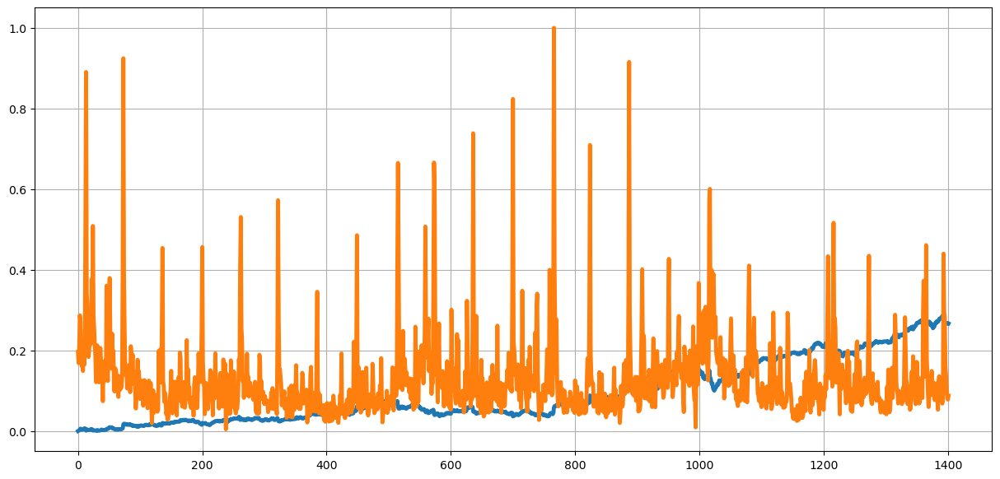

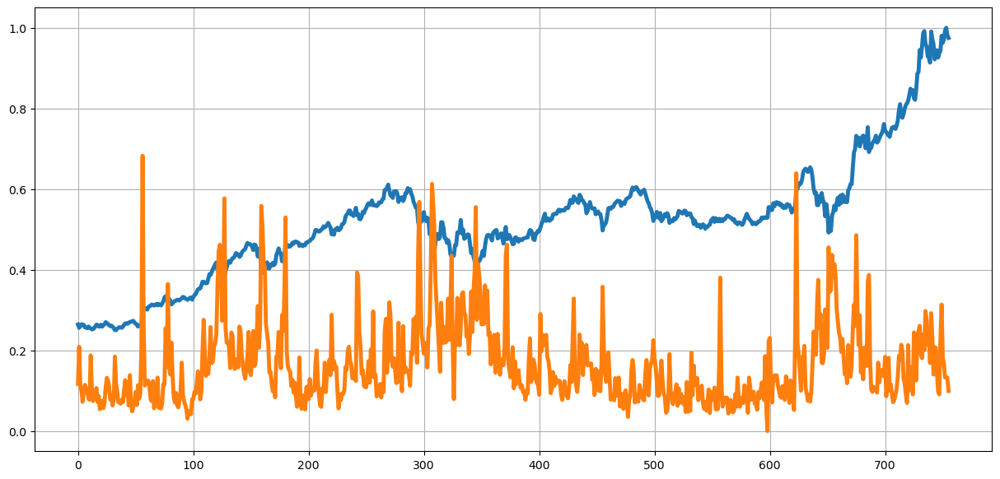

In [60]:
show_plot(X_train_AMZN, 'Training Data for AMAZON')

show_plot(X_test_AMZN, 'Testing Data for AMAZON')

In [61]:
# S&P500 

price_volume_sp500 = individual_stocks(stock_df, stock_volume_df, 'sp500')
price_volume_sp500

,Date,Close,Volume
0,2012-01-12,1295.500000,4019890000
1,2012-01-13,1289.089966,3692370000
2,2012-01-17,1293.670044,4010490000
3,2012-01-18,1308.040039,4096160000
4,2012-01-19,1314.500000,4465890000
...,...,...,...
2154,2020-08-05,3327.770020,4732220000
2155,2020-08-06,3349.159912,4267490000
2156,2020-08-07,3351.280029,4104860000
2157,2020-08-10,3360.469971,4318570000


In [62]:
price_volume_target_sp500 = trading_window(price_volume_sp500)
price_volume_target_sp500

,Date,Close,Volume,Target
0,2012-01-12,1295.500000,4019890000,1289.089966
1,2012-01-13,1289.089966,3692370000,1293.670044
2,2012-01-17,1293.670044,4010490000,1308.040039
3,2012-01-18,1308.040039,4096160000,1314.500000
4,2012-01-19,1314.500000,4465890000,1315.380005
...,...,...,...,...
2154,2020-08-05,3327.770020,4732220000,3349.159912
2155,2020-08-06,3349.159912,4267490000,3351.280029
2156,2020-08-07,3351.280029,4104860000,3360.469971
2157,2020-08-10,3360.469971,4318570000,3333.689941


In [63]:
price_volume_target_sp500 = price_volume_target_sp500[:-1]
price_volume_target_sp500

,Date,Close,Volume,Target
0,2012-01-12,1295.500000,4019890000,1289.089966
1,2012-01-13,1289.089966,3692370000,1293.670044
2,2012-01-17,1293.670044,4010490000,1308.040039
3,2012-01-18,1308.040039,4096160000,1314.500000
4,2012-01-19,1314.500000,4465890000,1315.380005
...,...,...,...,...
2153,2020-08-04,3306.510010,4621670000,3327.770020
2154,2020-08-05,3327.770020,4732220000,3349.159912
2155,2020-08-06,3349.159912,4267490000,3351.280029
2156,2020-08-07,3351.280029,4104860000,3360.469971


In [64]:
sp500_price_volume_target_scaled = sc.fit_transform(price_volume_target_sp500.drop(columns = ['Date']))

sp500_price_volume_target_scaled

array([[0.00828228, 0.35544202, 0.00524163],
       [0.00524163, 0.31342927, 0.00741423],
       [0.00741423, 0.35423623, 0.01423076],
       ...,
       [0.98245348, 0.38720299, 0.98345918],
       [0.98345918, 0.36634157, 0.9878185 ],
       [0.9878185 , 0.3937553 , 0.97511517]])

In [65]:
X_sp500 = sp500_price_volume_target_scaled[:, :2]

y_sp500 = sp500_price_volume_target_scaled[:, 2:]

In [66]:
X_sp500.shape

(2158, 2)

In [67]:
y_sp500.shape

(2158, 1)

In [68]:
split_sp500 = int(0.65*len(X_sp500))

split_sp500

1402

In [69]:
X_train_sp500 = X_sp500[:split_sp500]

In [70]:
X_test_sp500 = X_sp500[split_sp500:]

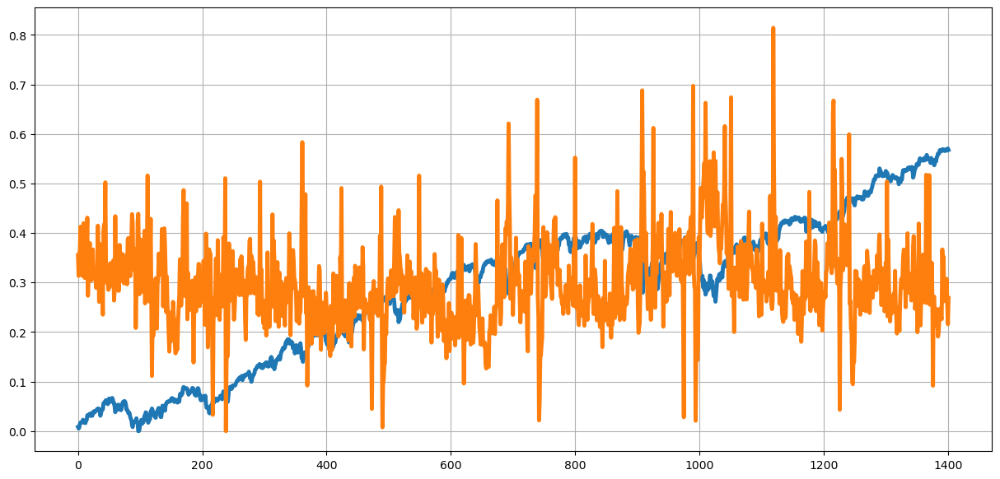

In [71]:
show_plot(X_train_sp500, "Training Data for S&P 500 stock")

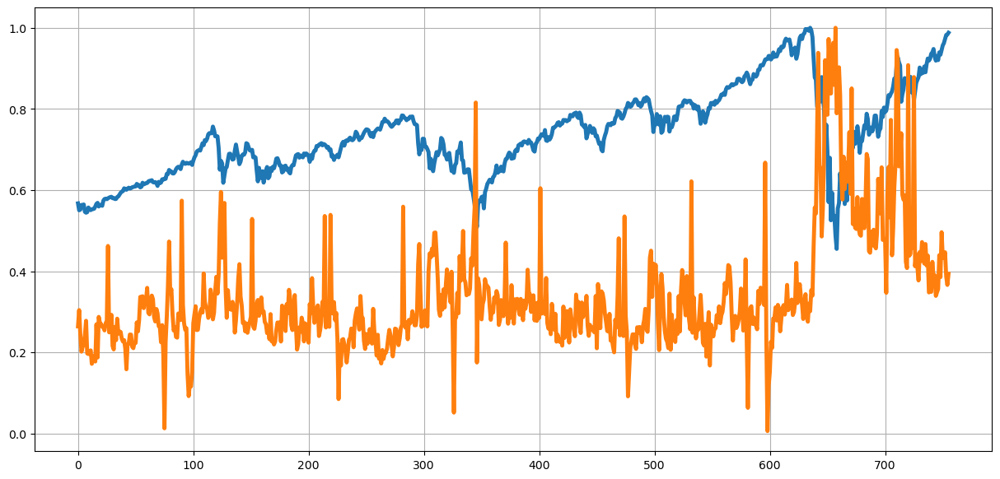

In [72]:
show_plot(X_test_sp500, "Testing Data for S&P 500 stock")

In [73]:
y_train_sp500 = y_sp500[:split_sp500]

In [74]:
y_test_sp500 = y_sp500[split_sp500:]

# TASK: BUILD AND TRAIN A RIDGE LINEAR REGRESSION MODEL

In [75]:
from sklearn.linear_model import Ridge
# Note that Ridge regression performs linear least squares with L2 regularization.
# Create and train the Ridge Linear Regression  Model

Regression_Model = Ridge()

Regression_Model.fit(X_train, y_train)

Ridge()

In [76]:
# Test the model and calculate its accuracy

lr_accuracy = Regression_Model.score(X_test, y_test)

print("Ridge Regression Score: ", lr_accuracy)

Ridge Regression Score:  0.7950028030821754


In [77]:
# Make Prediction

predicted_prices = Regression_Model.predict(X)

predicted_prices


array([[0.03466412],
       [0.03374627],
       [0.03451936],
       ...,
       [0.81048342],
       [0.78876033],
       [0.80091324]])

In [78]:
# Append the predicted values into a list

predicted = []

for i in predicted_prices:
    predicted.append(i[0])


In [79]:
len(predicted)

2158

In [80]:
# Append the close values to the list
close = []
for i in price_volume_target_scaled_df:
  close.append(i[0])

In [81]:
# Create a dataframe based on the dates in the individual stock data

df_predicted = price_volume_target_df[['Date']]

df_predicted

,Date
0,2012-01-12
1,2012-01-13
2,2012-01-17
3,2012-01-18
4,2012-01-19
...,...
2153,2020-08-04
2154,2020-08-05
2155,2020-08-06
2156,2020-08-07


In [82]:
# Add the close values to the dataframe

df_predicted['Close'] = close

df_predicted

,Date,Close
0,2012-01-12,0.011026
1,2012-01-13,0.010462
2,2012-01-17,0.012209
3,2012-01-18,0.013785
4,2012-01-19,0.013299
...,...,...
2153,2020-08-04,0.957606
2154,2020-08-05,0.961583
2155,2020-08-06,1.000000
2156,2020-08-07,0.972088


In [83]:
# Add the predicted values to the dataframe
df_predicted['Predicted Target'] = predicted

df_predicted

,Date,Close,Predicted Target
0,2012-01-12,0.011026,0.034664
1,2012-01-13,0.010462,0.033746
2,2012-01-17,0.012209,0.034519
3,2012-01-18,0.013785,0.034556
4,2012-01-19,0.013299,0.034707
...,...,...,...
2153,2020-08-04,0.957606,0.778280
2154,2020-08-05,0.961583,0.783205
2155,2020-08-06,1.000000,0.810483
2156,2020-08-07,0.972088,0.788760


In [84]:
# Plot the results
interactive_plot(df_predicted, "Predicted Target Stock Values for AAPL")

In [85]:
#In the above example, alpha was 1 by default.Let's try other values

Regression_model_sp500 = Ridge(alpha = 1.5)

Regression_model_sp500.fit(X_train_sp500, y_train_sp500)

Ridge(alpha=1.5)

In [86]:
# Test the model and calculate its accuracy

lr_accuracy_sp500 = Regression_model_sp500.score(X_test_sp500, y_test_sp500)

print("Ridge Regression Score for S&P 500:", lr_accuracy_sp500)

Ridge Regression Score for S&P 500: 0.929911889440339


In [87]:
# Make Prediction

predicted_prices_sp500 = Regression_model_sp500.predict(X_sp500)

predicted_prices_sp500

array([[0.02172867],
       [0.01873662],
       [0.02089807],
       ...,
       [0.95097894],
       [0.9518926 ],
       [0.95611051]])

In [88]:
# Append the predicted values into a list

predicted_sp500 = []

for i in predicted_prices_sp500:
    predicted_sp500.append(i[0])

In [89]:
len(predicted_sp500)

2158

In [90]:
close_sp500 = []

for i in sp500_price_volume_target_scaled:
    close_sp500.append(i[0])

In [91]:
len(close_sp500)

2158

In [92]:
predicted_sp500_df = price_volume_target_sp500[['Date']]

predicted_sp500_df

,Date
0,2012-01-12
1,2012-01-13
2,2012-01-17
3,2012-01-18
4,2012-01-19
...,...
2153,2020-08-04
2154,2020-08-05
2155,2020-08-06
2156,2020-08-07


In [93]:
predicted_sp500_df['Close'] = close_sp500

predicted_sp500_df

,Date,Close
0,2012-01-12,0.008282
1,2012-01-13,0.005242
2,2012-01-17,0.007414
3,2012-01-18,0.014231
4,2012-01-19,0.017295
...,...,...
2153,2020-08-04,0.962222
2154,2020-08-05,0.972307
2155,2020-08-06,0.982453
2156,2020-08-07,0.983459


In [94]:
predicted_sp500_df['Predicted'] = predicted_sp500

predicted_sp500_df

,Date,Close,Predicted
0,2012-01-12,0.008282,0.021729
1,2012-01-13,0.005242,0.018737
2,2012-01-17,0.007414,0.020898
3,2012-01-18,0.014231,0.027424
4,2012-01-19,0.017295,0.030450
...,...,...,...
2153,2020-08-04,0.962222,0.931781
2154,2020-08-05,0.972307,0.941431
2155,2020-08-06,0.982453,0.950979
2156,2020-08-07,0.983459,0.951893


In [95]:
interactive_plot(predicted_sp500_df,"Original Vs. Predicted Price for S&P 500")

# TASK: TRAIN AN LSTM TIME SERIES MODEL

In [96]:
# Let's test the functions and get individual stock prices and volumes for AAPL
price_volume_df 

,Date,Close,Volume,Target
0,2012-01-12,60.198570,53146800,59.972858
1,2012-01-13,59.972858,56505400,60.671429
2,2012-01-17,60.671429,60724300,61.301430
3,2012-01-18,61.301430,69197800,61.107143
4,2012-01-19,61.107143,65434600,60.042858
...,...,...,...,...
2154,2020-08-05,440.250000,30498000,455.609985
2155,2020-08-06,455.609985,50607200,444.450012
2156,2020-08-07,444.450012,49453300,450.910004
2157,2020-08-10,450.910004,53100900,437.500000


In [97]:
price_volume_df1 = price_volume_df.drop(columns = ['Target'])

price_volume_df1

,Date,Close,Volume
0,2012-01-12,60.198570,53146800
1,2012-01-13,59.972858,56505400
2,2012-01-17,60.671429,60724300
3,2012-01-18,61.301430,69197800
4,2012-01-19,61.107143,65434600
...,...,...,...
2154,2020-08-05,440.250000,30498000
2155,2020-08-06,455.609985,50607200
2156,2020-08-07,444.450012,49453300
2157,2020-08-10,450.910004,53100900


In [98]:
# Get the close and volume data as training data (Input)
training_data = price_volume_df1.iloc[:, 1:3].values

training_data

array([[6.01985700e+01, 5.31468000e+07],
       [5.99728580e+01, 5.65054000e+07],
       [6.06714290e+01, 6.07243000e+07],
       ...,
       [4.44450012e+02, 4.94533000e+07],
       [4.50910004e+02, 5.31009000e+07],
       [4.37500000e+02, 4.68711000e+07]])

In [99]:
# Normalize the data
from sklearn.preprocessing import MinMaxScaler

sc = MinMaxScaler(feature_range= (0,1))

training_data_scaled = sc.fit_transform(training_data)

In [100]:
training_data_scaled

array([[0.01102638, 0.11442624],
       [0.01046185, 0.12362365],
       [0.01220906, 0.13517696],
       ...,
       [0.97208751, 0.10431171],
       [0.98824476, 0.11430054],
       [0.95470465, 0.09724045]])

In [101]:
# Create the training and testing data, training data contains present day and previous day values

X = []

y = []

for i in range(1, len(price_volume_df1)):
    X.append(training_data_scaled[i-1:i, 0])
    y.append(training_data_scaled[i,0])


In [117]:
X.shape

(2158, 1)

In [103]:
# Convert the data into array format

X = np.asarray(X)

y = np.asarray(y)


In [104]:
# Split the data
split = int(0.7*len(X))

X_train = X[:split]
X_test = X[split:]
y_train = y[:split]
y_test = y[split:]

In [105]:
# Reshape the 1D arrays to 3D arrays to feed in the model

X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))

X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

X_train.shape, X_test.shape


((1510, 1, 1), (648, 1, 1))

In [106]:
X_train.shape[1]

1

In [107]:
# Create the model

inputs = keras.layers.Input(shape = (X_train.shape[1], X_train.shape[2]))

x = keras.layers.LSTM(150, return_sequences = True) (inputs)

x = keras.layers.LSTM(150, return_sequences = True)(x)

x = keras.layers.LSTM(150, return_sequences = True)(x)

outputs = keras.layers.Dense(1, activation = 'linear')(x)

model = keras.Model(inputs = inputs, outputs = outputs )

model.compile(optimizer = 'adam', loss = 'mse')

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 1, 1)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 1, 150)              │          91,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 1, 150)              │         180,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 1, 150)              │         180,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1, 1)                │             151 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 452,551 (1.73 MB)

 Trainable params: 452,551 (1.73 MB)

 Non-trainable params: 0 (0.00 B)

In [108]:
# Train the model

history = model.fit(X_train, y_train, epochs =20, batch_size= 32, validation_split= 0.2)

Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - loss: 0.0060 - val_loss: 0.0209
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0026 - val_loss: 0.0208
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0025 - val_loss: 0.0203
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0024 - val_loss: 0.0188
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0025 - val_loss: 0.0194
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0026 - val_loss: 0.0196
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0026 - val_loss: 0.0212
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0025 - val_loss: 0.0206
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0026 - val_loss: 0.0176
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0027 - val_loss: 0.0197
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0026 - val_loss: 0.0201
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0

In [109]:
# Make prediction
predicted = model.predict(X)

68/68 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step


In [110]:
test_predicted = []

for i in predicted:
    test_predicted.append(i[0][0])

In [116]:
len(test_predicted)

2158

In [112]:
df1_predicted = price_volume_df1[1:][['Date', 'Close']]

df1_predicted

,Date,Close
1,2012-01-13,59.972858
2,2012-01-17,60.671429
3,2012-01-18,61.301430
4,2012-01-19,61.107143
5,2012-01-20,60.042858
...,...,...
2154,2020-08-05,440.250000
2155,2020-08-06,455.609985
2156,2020-08-07,444.450012
2157,2020-08-10,450.910004


In [113]:
df1_predicted['Predictions'] = test_predicted

df1_predicted

,Date,Close,Predictions
1,2012-01-13,59.972858,0.084774
2,2012-01-17,60.671429,0.084768
3,2012-01-18,61.301430,0.084786
4,2012-01-19,61.107143,0.084802
5,2012-01-20,60.042858,0.084797
...,...,...,...
2154,2020-08-05,440.250000,0.094464
2155,2020-08-06,455.609985,0.094505
2156,2020-08-07,444.450012,0.094897
2157,2020-08-10,450.910004,0.094612


In [114]:
interactive_plot(df1_predicted, "Original Price Vs. Predictions")